## Import Section

In [2]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
import re
import pandas as pd
import librosa
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Input
from sklearn.model_selection import train_test_split
import IPython.display as ipd
from tensorflow.keras.models import load_model

## Dataset

In [4]:
DATASET_PATH = "COVID-19"
JSON_PATH = "metadata.json"

<IPython.core.display.Javascript object>

In [5]:
len(os.listdir(DATASET_PATH))  # total number of samples in the dataset

422

<IPython.core.display.Javascript object>

In [6]:
single_sample = os.listdir(DATASET_PATH)[0]

<IPython.core.display.Javascript object>

## Particular Dataset Information

In [7]:
os.listdir(os.path.join(DATASET_PATH, single_sample))

['vowel-o.wav',
 'vowel-a.wav',
 'breathing-shallow.wav',
 'cough-shallow.wav',
 'vowel-e.wav',
 'cough-heavy.wav',
 'breathing-deep.wav',
 'counting-normal.wav',
 'metadata.json',
 'counting-fast.wav']

<IPython.core.display.Javascript object>

In [9]:
os.listdir(os.path.join(DATASET_PATH, single_sample))[-2]

'metadata.json'

<IPython.core.display.Javascript object>

In [10]:
# read json file
metadata = json.load(open(os.path.join(DATASET_PATH, single_sample, JSON_PATH)))

<IPython.core.display.Javascript object>

In [11]:
metadata

{'a': 22,
 'covid_status': 'no_resp_illness_exposed',
 'dT': 'web',
 'ep': 'y',
 'fV': 2,
 'g': 'male',
 'l_c': 'India',
 'l_l': 'Ahmedabad',
 'l_s': 'Gujarat',
 'rU': 'n',
 'um': 'n'}

<IPython.core.display.Javascript object>

In [10]:
covid_status = set()

for path in os.listdir(DATASET_PATH):
    sample_path = os.path.join(DATASET_PATH, path)
    d = os.listdir(sample_path)
    if len(d) != 0:
        metadata = json.load(open(os.path.join(sample_path, JSON_PATH)))
        covid_stats = metadata["covid_status"]
        covid_status.add(covid_stats)
    else:
        os.rmdir(os.path.join(DATASET_PATH, path))

<IPython.core.display.Javascript object>

In [11]:
covid_status  # Total Categories

{'healthy',
 'no_resp_illness_exposed',
 'positive_asymp',
 'positive_mild',
 'positive_moderate',
 'recovered_full',
 'resp_illness_not_identified'}

<IPython.core.display.Javascript object>

In [12]:
len(os.listdir(DATASET_PATH))  # 2 empty folder are removed

422

<IPython.core.display.Javascript object>

### Following Id's are contained None Signal or 0 length signal that's why we will remove following id's data.
* 9z2XQAVyIkb0saZVigWBr3MsDcr1
* 94OSQGpJCiSuQtHifnlYyOIKL0E2

## Processing

In [12]:
files = []

# r=root, d=directories, f = files

for r, d, f in os.walk(DATASET_PATH):
    for file in f:
        if ".wav" in file:
            files.append(os.path.join(r, file))

<IPython.core.display.Javascript object>

In [14]:
files[:9]

['COVID-19/7DfMFXPDu3W2Fxjs8w0OsLIY8em1/vowel-o.wav',
 'COVID-19/7DfMFXPDu3W2Fxjs8w0OsLIY8em1/vowel-a.wav',
 'COVID-19/7DfMFXPDu3W2Fxjs8w0OsLIY8em1/breathing-shallow.wav',
 'COVID-19/7DfMFXPDu3W2Fxjs8w0OsLIY8em1/cough-shallow.wav',
 'COVID-19/7DfMFXPDu3W2Fxjs8w0OsLIY8em1/vowel-e.wav',
 'COVID-19/7DfMFXPDu3W2Fxjs8w0OsLIY8em1/cough-heavy.wav',
 'COVID-19/7DfMFXPDu3W2Fxjs8w0OsLIY8em1/breathing-deep.wav',
 'COVID-19/7DfMFXPDu3W2Fxjs8w0OsLIY8em1/counting-normal.wav',
 'COVID-19/7DfMFXPDu3W2Fxjs8w0OsLIY8em1/counting-fast.wav']

<IPython.core.display.Javascript object>

In [46]:
ipd.Audio(files[0])  # vowel-o.wav

<IPython.core.display.Javascript object>

In [47]:
ipd.Audio(files[1])  # vowel-a.wav

<IPython.core.display.Javascript object>

In [48]:
ipd.Audio(files[2])  # breathing-shallow.wav

<IPython.core.display.Javascript object>

In [49]:
ipd.Audio(files[3])  # cough-shallow.wav

<IPython.core.display.Javascript object>

In [50]:
ipd.Audio(files[4])  # vowel-e.wav

<IPython.core.display.Javascript object>

In [51]:
ipd.Audio(files[5])  # cough-heavy.wav

<IPython.core.display.Javascript object>

In [52]:
ipd.Audio(files[6])  # breathing-deep.wav

<IPython.core.display.Javascript object>

In [53]:
ipd.Audio(files[7])  # counting-normal.wav

<IPython.core.display.Javascript object>

In [54]:
ipd.Audio(files[8])  # counting-fast.wav

<IPython.core.display.Javascript object>

## Feature Exploration

In [120]:
vowel_o = files[0]

<IPython.core.display.Javascript object>

In [121]:
y, sr = librosa.load(vowel_o, sr=None)

<IPython.core.display.Javascript object>

In [122]:
rmse = librosa.feature.rms(y)[0]

<IPython.core.display.Javascript object>

In [154]:
chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)[0]
spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)[0]
spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]
zcr = librosa.feature.zero_crossing_rate(y=y)[0]

<IPython.core.display.Javascript object>

In [155]:
def calculalte_t(feature):
    frames = range(len(feature))
    t = librosa.frames_to_time(frames)
    return t

<IPython.core.display.Javascript object>

In [156]:
def plot_feature(feature, title, c="r"):
#     plt.figure(figsize=(8,10))
    t = calculalte_t(feature)
    librosa.display.waveplot(y, alpha=0.5)
    plt.plot(t, feature, color=c)
    plt.title(title)
    plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


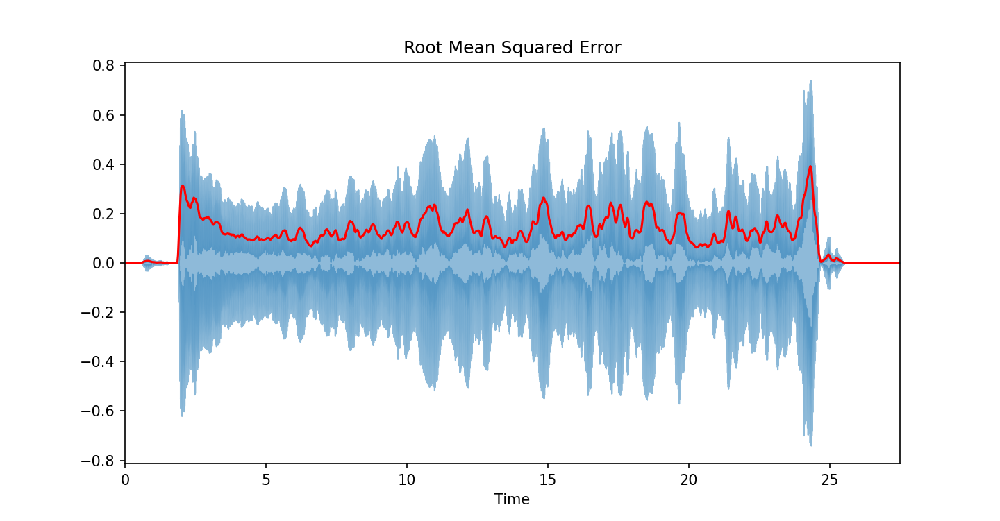

<IPython.core.display.Javascript object>

In [143]:
plot_feature(rmse, "Root Mean Squared Error")

<IPython.core.display.Javascript object>


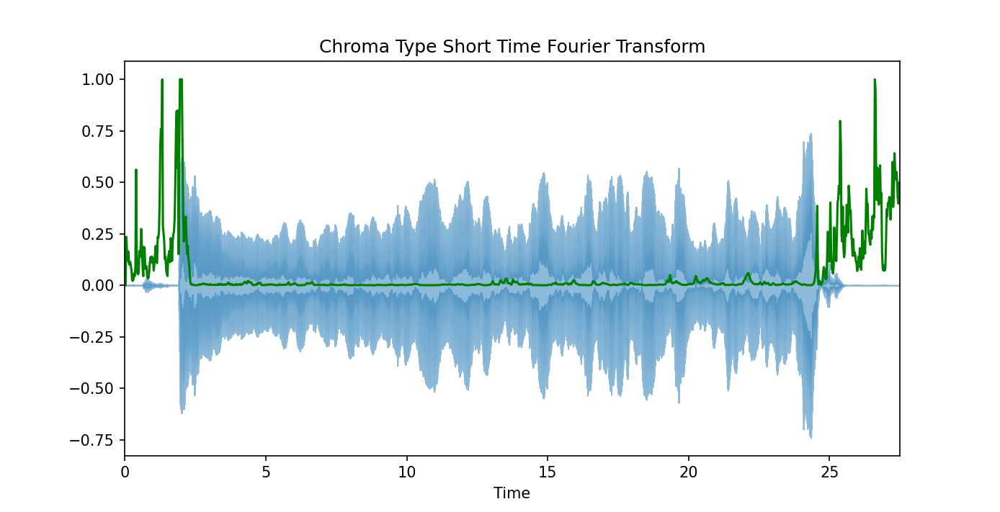

<IPython.core.display.Javascript object>

In [158]:
plot_feature(chroma_stft, "Chroma Type Short Time Fourier Transform", "green")

<IPython.core.display.Javascript object>


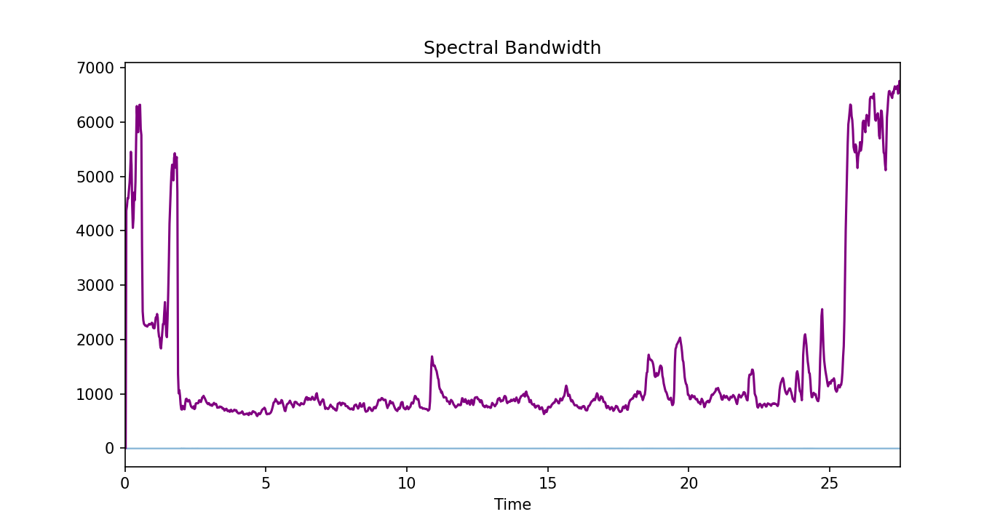

<IPython.core.display.Javascript object>

In [159]:
plot_feature(spectral_bandwidth, "Spectral Bandwidth", "purple")

<IPython.core.display.Javascript object>


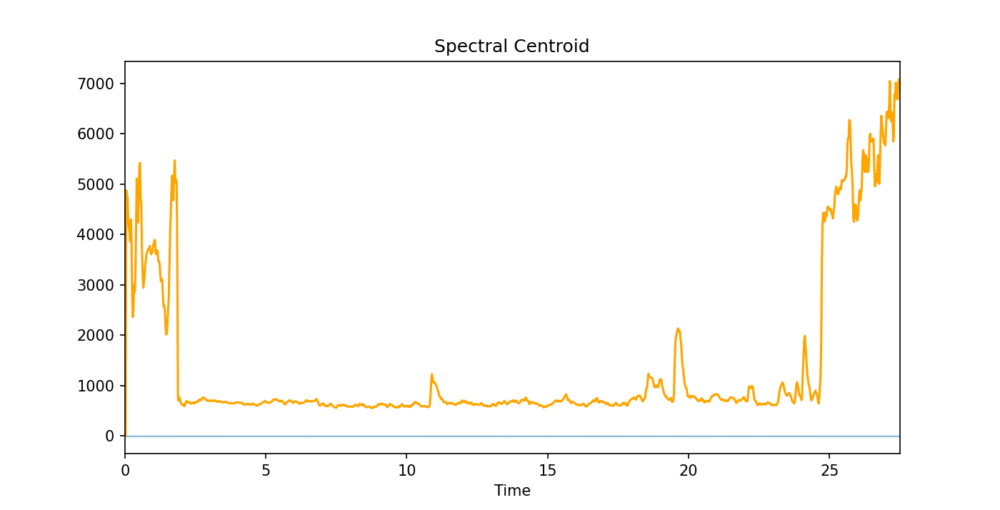

<IPython.core.display.Javascript object>

In [160]:
plot_feature(spectral_centroid, "Spectral Centroid", "orange")

<IPython.core.display.Javascript object>


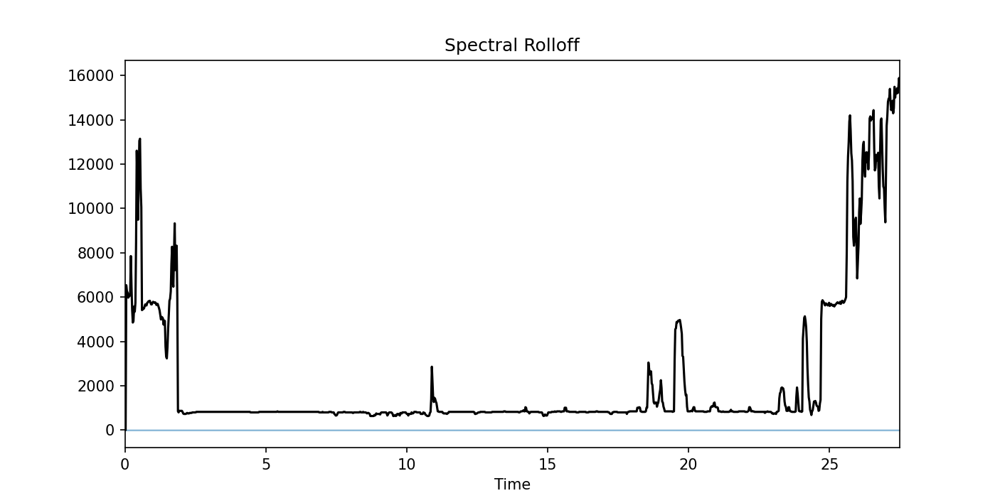

<IPython.core.display.Javascript object>

In [162]:
plot_feature(spectral_rolloff, "Spectral Rolloff", "black")

<IPython.core.display.Javascript object>


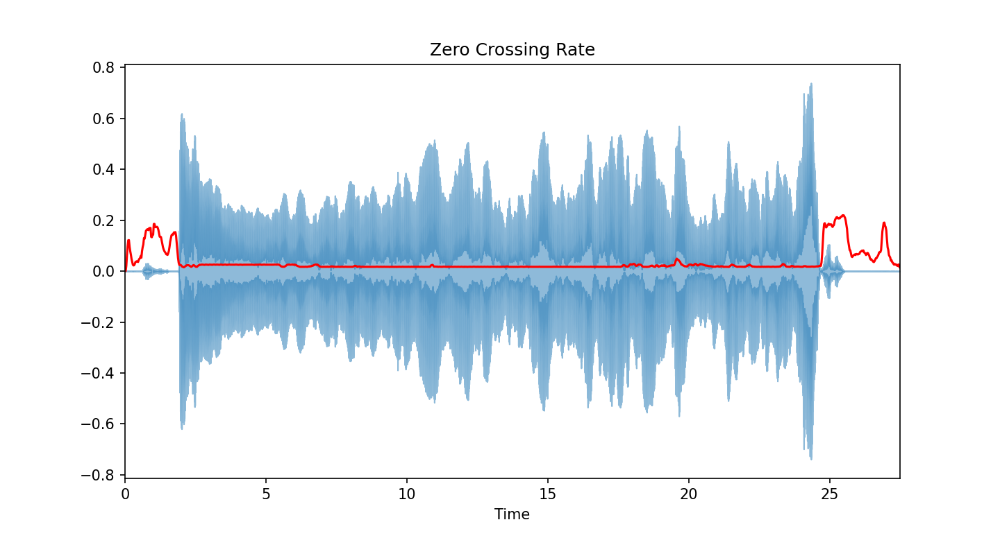

<IPython.core.display.Javascript object>

In [163]:
plot_feature(zcr, "Zero Crossing Rate", "red")

## Basic Feature Extraction

In [15]:
# RMSE = []
# chroma_stft = []
# spec_cent = []
# spec_bw = []
# rolloff = []
# zcr = []
# user_id = []
# covid_status = []

# for f in files:

#     y, sr = librosa.load(f, sr=None)

#     if y is None or len(y) == 0:
#         continue

#     else:
#         user_id.append(f.split("/")[1])

#         metadata = json.load(open("/".join(f.split("/")[:2]) + "/metadata.json"))

#         covid_status.append(metadata["covid_status"])

#         # Root Mean Squared Error
#         RMSE.append(np.mean(librosa.feature.rms(y)[0]))

#         # Chroma Based Short Time Fourier Transform
#         chroma_stft.append(np.mean(librosa.feature.chroma_stft(y=y, sr=sr)))

#         # Spectral Centroid
#         spec_cent.append(np.mean(librosa.feature.spectral_centroid(y=y, sr=sr)))

#         # Spectral Bandwidth
#         spec_bw.append(np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr)))

#         # Spectral RollOff
#         rolloff.append(np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr)))

#         # Zero Crossing Rate
#         zcr.append(np.mean(librosa.feature.zero_crossing_rate(y)))

# #         mfccs = librosa.feature.mfcc(y=y, sr=sr)
# #         m = []

# #         for e in mfccs:
# #             m.append(np.mean(e))
# #         mfcc.append(m)

<IPython.core.display.Javascript object>

In [16]:
# data = pd.DataFrame(
#     {
#         "user_id": user_id,
#         "filepath": files,
#         "RMSE": RMSE,
#         "chroma_stft": chroma_stft,
#         "spec_cent": spec_cent,
#         "spec_bw": spec_bw,
#         "spec_rolloff": rolloff,
#         "zcr": zcr,
#     }
# )

<IPython.core.display.Javascript object>

In [17]:
# data["covid_status"] = covid_status  # target label

<IPython.core.display.Javascript object>

In [3]:
data = pd.read_csv("data.csv")

In [19]:
# data["covid_status"].value_counts()

<IPython.core.display.Javascript object>

In [21]:
# data["user_id"].value_counts()

<IPython.core.display.Javascript object>

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3798 entries, 0 to 3797
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   RMSE          3798 non-null   float64
 1   chroma_stft   3798 non-null   float64
 2   spec_cent     3798 non-null   float64
 3   spec_bw       3798 non-null   float64
 4   spec_rolloff  3798 non-null   float64
 5   zcr           3798 non-null   float64
 6   covid_status  3798 non-null   int64  
 7   new_user_id   3798 non-null   int64  
 8   filename      3798 non-null   int64  
dtypes: float64(6), int64(3)
memory usage: 267.2 KB


In [23]:
3798 / 9

422.0

<IPython.core.display.Javascript object>

In [6]:
from sklearn.preprocessing import LabelEncoder

In [25]:
# le = LabelEncoder()
# data["new_user_id"] = le.fit_transform(data["user_id"])

<IPython.core.display.Javascript object>

In [26]:
# data["filename"] = data["filepath"].apply(lambda x: x.split("/")[2])

<IPython.core.display.Javascript object>

In [28]:
# data.drop(["filepath", "user_id"], inplace=True, axis=1)

<IPython.core.display.Javascript object>

In [29]:
data.head()

,Unnamed: 0,RMSE,chroma_stft,spec_cent,spec_bw,spec_rolloff,zcr,covid_status,new_user_id,filename
0,0,0.118379,0.253389,1390.837727,1459.099553,2264.121835,0.034621,1,43,8
1,1,0.144788,0.246714,1774.427666,2057.234269,3452.113464,0.020360,1,43,6
2,2,0.000135,0.495409,5502.609625,5720.697350,11688.208532,0.051564,1,43,1
3,3,0.018265,0.434287,4009.550598,4088.996725,7927.490831,0.065998,1,43,3
4,4,0.107049,0.297738,1623.703648,2021.015855,3080.055950,0.024948,1,43,7


<IPython.core.display.Javascript object>

In [ ]:
# cs_le = LabelEncoder()  # covid status label Encoder
# file_le = LabelEncoder()  # filename Label Encoder

In [ ]:
# data["filename"] = file_le.fit_transform(data["filename"])
# data["covid_status"] = cs_le.fit_transform(data["covid_status"])

In [7]:
cs_le = LabelEncoder()
cs_le.classes_ = np.load("cs_le.npy", allow_pickle=True)

file_le = LabelEncoder()
file_le.classes_ = np.load("file_le.npy", allow_pickle=True)

In [8]:
cs_le.classes_

array(['healthy', 'no_resp_illness_exposed', 'positive_asymp',
       'positive_mild', 'positive_moderate', 'recovered_full',
       'resp_illness_not_identified'], dtype=object)

In [9]:
file_le.classes_

array(['breathing-deep.wav', 'breathing-shallow.wav', 'cough-heavy.wav',
       'cough-shallow.wav', 'counting-fast.wav', 'counting-normal.wav',
       'vowel-a.wav', 'vowel-e.wav', 'vowel-o.wav'], dtype=object)

In [ ]:
# data.to_csv("data.csv")

In [ ]:
# saving both encoder

# np.save("cs_le.npy", cs_le.classes_)
# np.save("file_le.npy", file_le.classes_)

In [10]:
target = data["covid_status"]
data.drop(["covid_status", "new_user_id"], inplace=True, axis=1)

In [11]:
data = data.iloc[:, 1:]
data.head()

,chroma_stft,spec_cent,spec_bw,spec_rolloff,zcr,filename
0,0.253389,1390.837727,1459.099553,2264.121835,0.034621,8
1,0.246714,1774.427666,2057.234269,3452.113464,0.020360,6
2,0.495409,5502.609625,5720.697350,11688.208532,0.051564,1
3,0.434287,4009.550598,4088.996725,7927.490831,0.065998,3
4,0.297738,1623.703648,2021.015855,3080.055950,0.024948,7


In [38]:
# (user_id , audio features , audio files)

modified_data = data.values.reshape((422, 7, 9)).astype("float64")

<IPython.core.display.Javascript object>

In [39]:
modified_data[0][0]

array([1.18379205e-01, 2.53389360e-01, 1.39083773e+03, 1.45909955e+03,
       2.26412184e+03, 3.46209949e-02, 8.00000000e+00, 1.44788490e-01,
       2.46714490e-01])

<IPython.core.display.Javascript object>

In [40]:
target_values = []
for v in range(0, len(target), 9):
    target_values.append(target[v])

<IPython.core.display.Javascript object>

In [41]:
len(target_values)

422

<IPython.core.display.Javascript object>

In [42]:
np.save("features_data.npy", modified_data)
np.save("target_data.npy", target_values)

<IPython.core.display.Javascript object>

## Data Preparation
* Order of Features Must Be Same
    * RMSE
    * Chroma_Stft
    * Spec_cent
    * Spec_bw
    * Spec_rolloff
    * Zcr
    * Filename ( filename => file_le.fit_transform )

* Target:
    * covid_status ( covid_status => cs_le.fit_transform )
    
    
## File Information
* **features_data.npy** : our final feature array of shape (422 ,7 ,9)
* **targegt_data.npy** : final target array of shape (422 ,1)
* **cs_le.npy** : covid_status label encoder classes
* **file_le.npy** : filename label encoder classes
* **data.csv** : Informative Featured CSV file.
    

In [45]:
modified_data[0].shape # One Person Paricular Information

(7, 9)

<IPython.core.display.Javascript object>

# Deep Learning Model

In [12]:
n_classes = len(cs_le.classes_)

In [14]:
modified_data = np.load("features_data.npy")

In [19]:
target_values = np.load("target_data.npy")

In [105]:
model = Sequential()

model.add(Input(shape=modified_data[0].shape))
model.add(Flatten())

model.add(Dense(units=16, activation="relu"))
model.add(Dense(units=32, activation="relu"))
model.add(Dense(units=32, activation="relu"))
model.add(Dense(units=64, activation="relu"))
model.add(Dense(units=128, activation="relu"))
model.add(Dense(units=n_classes, activation="softmax"))

In [106]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_8 (Flatten)          (None, 63)                0         
_________________________________________________________________
dense_39 (Dense)             (None, 16)                1024      
_________________________________________________________________
dense_40 (Dense)             (None, 32)                544       
_________________________________________________________________
dense_41 (Dense)             (None, 32)                1056      
_________________________________________________________________
dense_42 (Dense)             (None, 7)                 231       
Total params: 2,855
Trainable params: 2,855
Non-trainable params: 0
_________________________________________________________________


In [107]:
model.compile(
    optimizer="adam",
    loss=tensorflow.keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"],
)

## Train Test  Split

In [108]:
X_train, X_test, y_train, y_test = train_test_split(
    modified_data, target_values, test_size=0.20, random_state=0
)

In [109]:
X_train.shape

(337, 7, 9)

In [110]:
X_test.shape

(85, 7, 9)

In [111]:
y_train = np.array(y_train)
y_train.shape

(337,)

In [112]:
y_test = np.array(y_test)
y_test.shape

(85,)

In [113]:
X_train.shape, X_test.shape

((337, 7, 9), (85, 7, 9))

## Model Training

In [116]:
model.fit(X_train, y_train, batch_size=1, epochs=14, validation_data=(X_test, y_test))

Epoch 1/14
49/49 [==============================] - 0s 1ms/step - loss: 5.7009 - accuracy: 0.4955 - val_loss: 7.6122 - val_accuracy: 0.5294
Epoch 2/14
49/49 [==============================] - 0s 968us/step - loss: 5.1602 - accuracy: 0.4837 - val_loss: 7.3491 - val_accuracy: 0.5529
Epoch 3/14
49/49 [==============================] - 0s 950us/step - loss: 4.9233 - accuracy: 0.5312 - val_loss: 7.4932 - val_accuracy: 0.5176
Epoch 4/14
49/49 [==============================] - 0s 932us/step - loss: 4.8741 - accuracy: 0.5134 - val_loss: 6.6047 - val_accuracy: 0.5176
Epoch 5/14
49/49 [==============================] - 0s 1ms/step - loss: 5.5126 - accuracy: 0.4777 - val_loss: 6.6802 - val_accuracy: 0.5412
Epoch 6/14
49/49 [==============================] - 0s 1ms/step - loss: 4.4012 - accuracy: 0.5193 - val_loss: 6.3549 - val_accuracy: 0.5529
Epoch 7/14
49/49 [==============================] - 0s 1ms/step - loss: 4.3631 - accuracy: 0.5223 - val_loss: 5.8759 - val_accuracy: 0.5412
Epoch 8/14
49/

In [117]:
model.evaluate(X_test, y_test)
# [loss , accuracy ]

3/3 [==============================] - 0s 696us/step - loss: 1.0552 - accuracy: 0.7059


[1.055246353149414, 0.7058823704719543]

<IPython.core.display.Javascript object>

In [118]:
model.save("model_1_70.h5")

<IPython.core.display.Javascript object>

### Loading Model

In [30]:
model = load_model("model_1_70.h5")

<IPython.core.display.Javascript object>

In [31]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_3 (Flatten)          (None, 63)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 16)                1024      
_________________________________________________________________
dense_14 (Dense)             (None, 32)                544       
_________________________________________________________________
dense_15 (Dense)             (None, 64)                2112      
_________________________________________________________________
dense_16 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_17 (Dense)             (None, 7)                 455       
Total params: 8,295
Trainable params: 8,295
Non-trainable params: 0
____________________________________________________

<IPython.core.display.Javascript object>

In [32]:
modified_data = np.load("features_data.npy")

<IPython.core.display.Javascript object>

In [33]:
target_values = np.load("target_data.npy")

<IPython.core.display.Javascript object>

In [36]:
modified_data.shape, target_values.shape

((422, 7, 9), (422,))

<IPython.core.display.Javascript object>